In [24]:
# imports
import boto3
import pandas as pd
import io
from io import BytesIO
import matplotlib.pyplot as plt
from agrilution_aws import DynamoDbApi
from boto3.dynamodb.conditions import Key, Attr
import logging
from IPython.display import display
import IPython
import numpy as np
import cv2
import requests

In [25]:
# Retrieve the data from dynamodb
dynamodb = boto3.resource('dynamodb')
table = dynamodb.Table('plantcube_images_dev')
response = table.scan()
data = response['Items']
df = pd.DataFrame(data)

In [26]:
# extract the required columns only
df = df[["plantcube","layer","dirty","timestamp","0","1","2","3","4","5","6","7","8","image_url"]]

In [27]:
# Get the image from s3 bucket
def get_input_image(s3_client, image_bucket:str, image_key:str)->np.ndarray:
    """downloads the input image that triggered the lambda from s3
    Args:
        s3_client: s3 client object from agrutils
        image_bucket (str): the bucket the image was put into
        image_key (str): the key of the uploaded image
    Raises:
        Exception: raises an exception if no image could be downloaded from s3
    Returns:
        matrix[integers]: returns the downloaded and decoded image
    """
    # read input image
    image_object = None
    # get object from s3
    image_object = s3_client.get_object(Bucket=image_bucket,Key=image_key)
    if not image_object:
        raise Exception('No image retrieved')
    # read body
    image_bytes = image_object['Body'].read()
    # transform bytes into array
    image_encoded = np.frombuffer(image_bytes, dtype=np.uint8)
    # decode image
    image_decoded = cv2.imdecode(image_encoded, cv2.IMREAD_COLOR)
    return image_decoded

In [28]:
# display the image in 3 by 3 grid
def display_image_as_grid(input_image,nordf):
    """
    Display the input image as a 3 by 3 grid, and display metadata for each grid cell.
    
    Parameters:
    - input_image (np.ndarray): The input image to be displayed.
    - nordf (pd.dataframe): Normalised row as input
    """
    import requests
    from io import BytesIO
    from PIL import Image
    import matplotlib.pyplot as plt
    
    image = Image.fromarray(input_image)

    # Get the width and height of the image
    width, height = image.size

    # Calculate the width and height of each grid cell
    cell_width = width // 3
    cell_height = height // 3

    # Initialize a list to store the cropped images
    cropped_images = []

    # Iterate over the grid cells
    for i in range(3):
        for j in range(3):
            # Calculate the top-left corner of the cell
            x1 = i * cell_width
            y1 = j * cell_height
            # Calculate the bottom-right corner of the cell
            x2 = x1 + cell_width
            y2 = y1 + cell_height
            # Crop the cell from the image
            cell = image.crop((x1, y1, x2, y2))
            # Add the cropped cell to the list
            cropped_images.append(cell)

    fig, ax = plt.subplots(3, 3,figsize=(10, 9))

    # Iterate over the rows of the subplots
    for i in range(3):
        # Iterate over the columns of the subplots
        for j in range(3):
            # Calculate the index of the cropped image
            index = i * 3 + j
            val = 'col'+str(index)
            slotpred = val+'.slot_pred'
            slotpredconf = val+'.slot_pred_conf'
            leafareacov = val+'.leaf_area_cov'
            plantpred = val+'.plant_pred'
            plantpredconf = val+'.plant_pred_conf'
            
            slotpred_value = nordf[str(slotpred)].values[0]
            slotpredconf_value = nordf[str(slotpredconf)].values[0]
            leafareacov_value = nordf[str(leafareacov)].values[0]
            plantpred_value = nordf[str(plantpred)].values[0]
            plantpredconf_value = nordf[str(plantpredconf)].values[0]
            
            # rounding it off to 2 digits
            if slotpredconf_value is None:
                slotpredconf_value = 'Null'
            else:
                slotpredconf_value = round(float(slotpredconf_value), 2)
            
            if leafareacov_value is None:
                leafareacov_value = 'Null'
            else:
                leafareacov_value = round(float(leafareacov_value), 2)
              
            if plantpredconf_value is None:
                plantpredconf_value = 'Null'
            else:
                plantpredconf_value = round(float(plantpredconf_value), 2)
            
            # Display the cropped image in the subplot
            title = 'Slot_pred: '+ str(slotpred_value) +'\n'+'Slot_pred_conf: '+ str(slotpredconf_value) +'\n'+'Leaf_area_cov: '+ str(leafareacov_value) +'\n'+'Plant_pred: '+ str(plantpred_value) +'\n'+'Plant_pred_conf: '+ str(plantpredconf_value)   
            ax[i][j].set_title(title)
            ax[i][j].title.set_fontsize(10)
            ax[i][j].text(0.6, 0.5, str(index + 1), fontsize=16, ha='left', va='top', color='orange')
            ax[j][i].imshow(cropped_images[index])
            ax[j][i].axis('off')

    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
    # Show the figure
    plt.show()

In [29]:
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

key of s3: v20-027ad775-d138-4fc6-9c84-38f06633f2d5/b/1660134835.jpeg
No Image is available
Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
657,v20-027ad775-d138-4fc6-9c84-38f06633f2d5,b,False,1660134835,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


No values in the slot

-----------------------------------------------------------------------------------------------
key of s3: v20-027ad775-d138-4fc6-9c84-38f06633f2d5/b/1660134909.jpeg


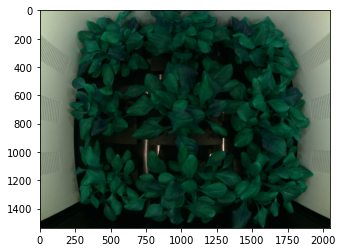

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
658,v20-027ad775-d138-4fc6-9c84-38f06633f2d5,b,False,1660134909,"{""slot_pred"":""Plant"",""slot_pred_conf"":0.835794...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.788932...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.631383...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.668627...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.618666...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.874504...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.826111...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.680290...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.861402...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


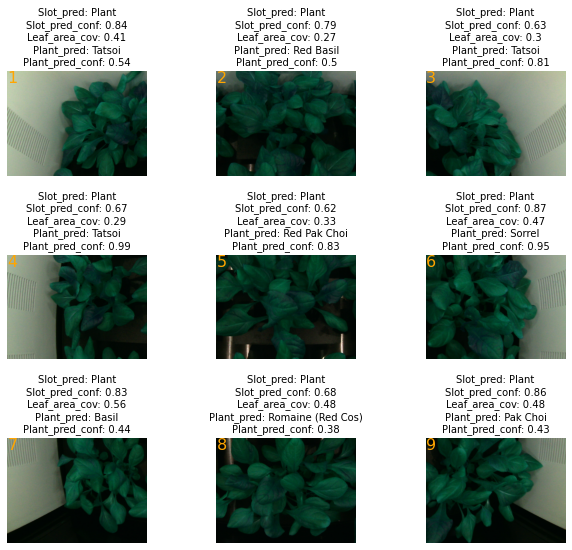

-----------------------------------------------------------------------------------------------
key of s3: v20-027ad775-d138-4fc6-9c84-38f06633f2d5/b/1660135454.jpeg
No Image is available
Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
659,v20-027ad775-d138-4fc6-9c84-38f06633f2d5,b,False,1660135454,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


No values in the slot

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1659960018.jpeg


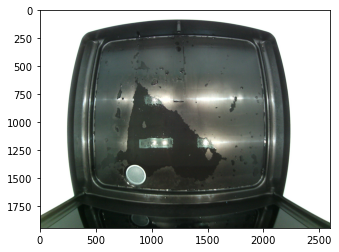

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
151,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1659960018,"{""slot_pred"":""Plant"",""slot_pred_conf"":0.437299...","{""slot_pred"":""Seedbar"",""slot_pred_conf"":0.6665...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.546883...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.760083...","{""slot_pred"":""Seedbar"",""slot_pred_conf"":0.4390...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.713740...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.541826...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.624999...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.535230...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


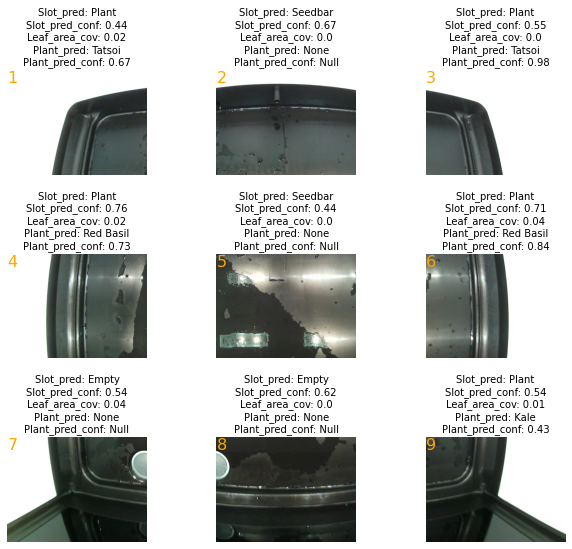

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1659967691.jpeg


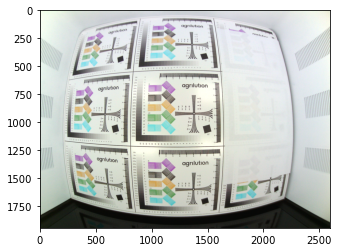

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
152,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1659967691,"{""slot_pred"":""Plant"",""slot_pred_conf"":0.741443...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.802375...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.532336...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.814547...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.792032...","{""slot_pred"":""Seedlings"",""slot_pred_conf"":0.55...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.616398...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.933298...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.793256...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


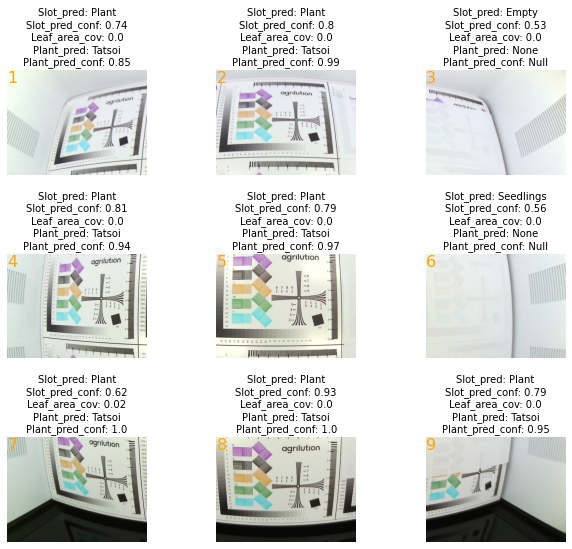

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1659967894.jpeg


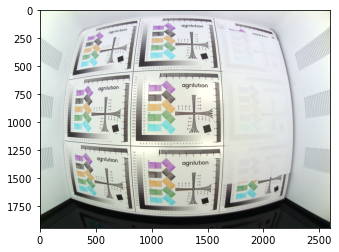

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
153,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1659967894,"{""slot_pred"":""Plant"",""slot_pred_conf"":0.786195...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.851948...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.547989...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.797374...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.803312...","{""slot_pred"":""Seedlings"",""slot_pred_conf"":0.55...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.757619...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.918543...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.777951...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


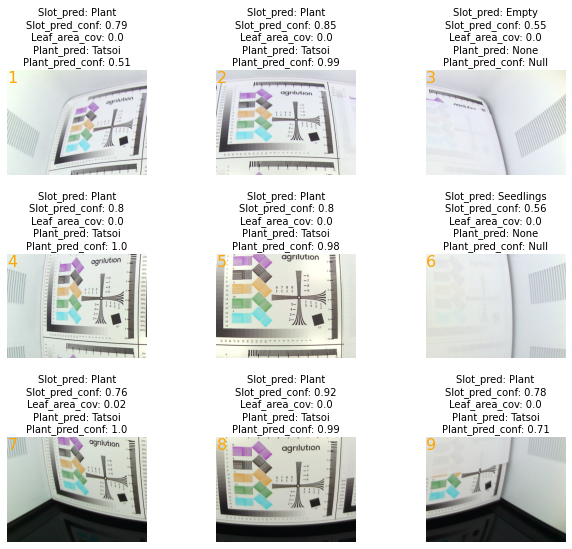

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1659968904.jpeg


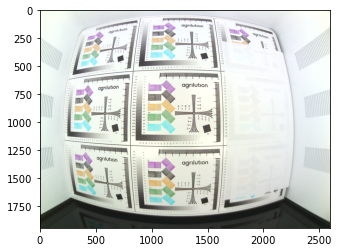

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
154,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1659968904,"{""slot_pred"":""Plant"",""slot_pred_conf"":0.752038...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.847035...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.592926...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.749334...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.725479...","{""slot_pred"":""Seedlings"",""slot_pred_conf"":0.59...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.727430...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.879307...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.459292...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


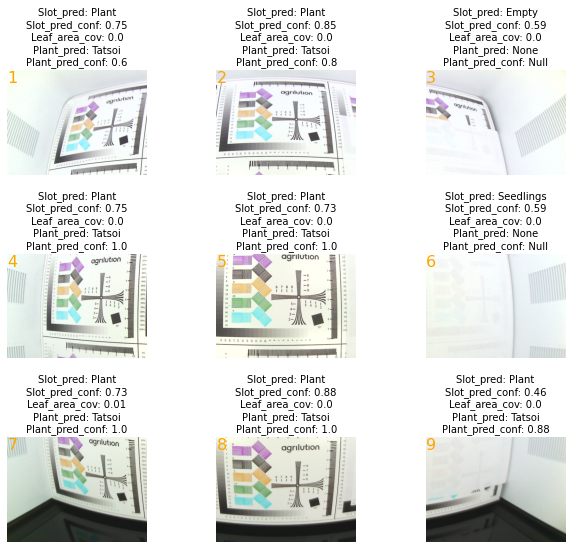

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1659969607.jpeg


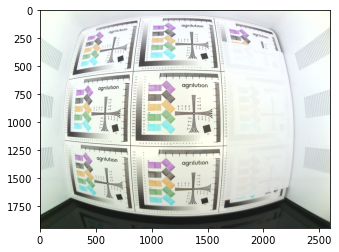

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
155,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1659969607,"{""slot_pred"":""Plant"",""slot_pred_conf"":0.743314...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.822708...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.601549...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.751867...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.725947...","{""slot_pred"":""Seedlings"",""slot_pred_conf"":0.59...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.699565...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.870001...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.437192...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


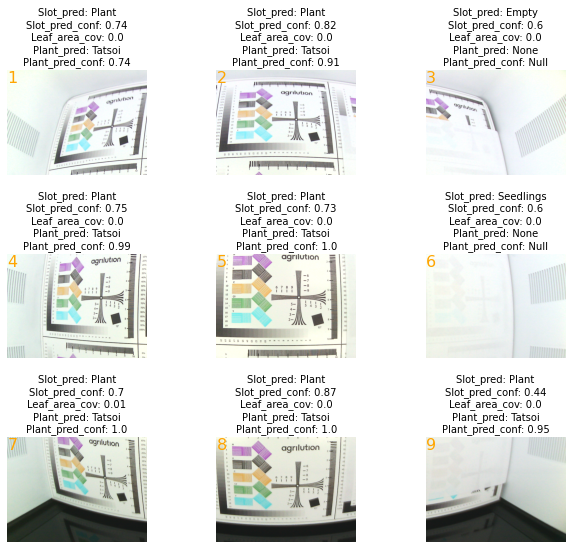

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660126053.jpeg


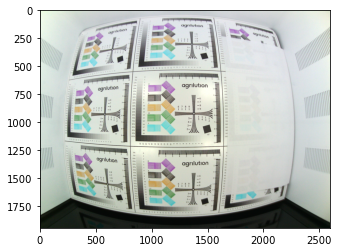

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
167,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660126053,"{""slot_pred"":""Plant"",""slot_pred_conf"":0.762587...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.852192...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.533972...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.865689...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.813513...","{""slot_pred"":""Seedlings"",""slot_pred_conf"":0.56...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.563459...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.935918...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.681361...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


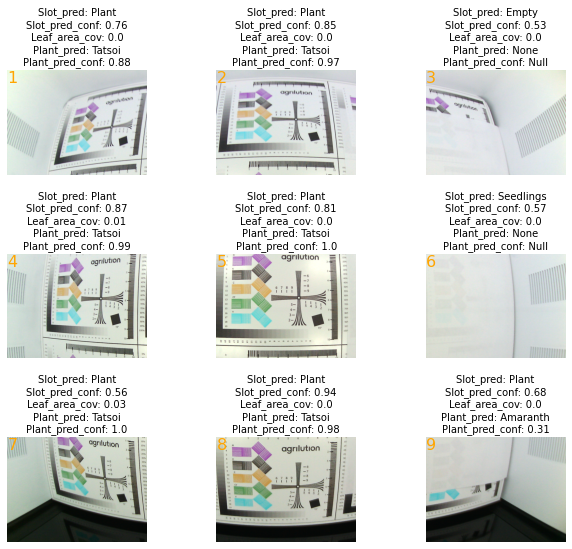

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660126394.jpeg


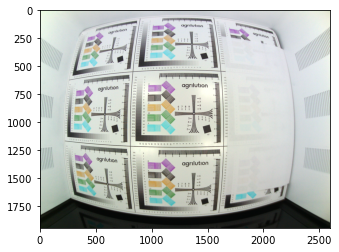

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
170,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660126394,"{""slot_pred"":""Plant"",""slot_pred_conf"":0.787488...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.867516...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.566165...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.875892...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.811504...","{""slot_pred"":""Seedlings"",""slot_pred_conf"":0.56...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.542407...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.929660...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.657056...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


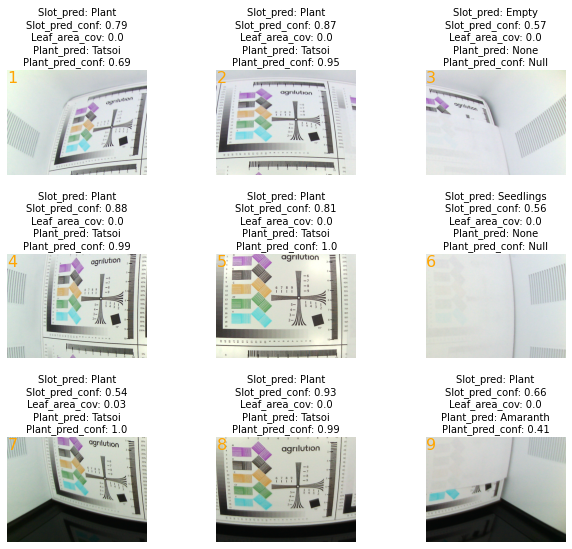

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660126565.jpeg


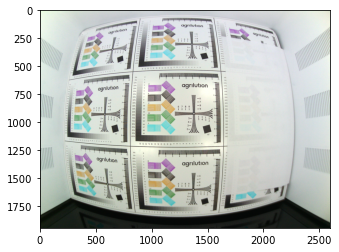

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
172,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660126565,"{""slot_pred"":""Plant"",""slot_pred_conf"":0.796755...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.866761...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.561661...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.873342...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.796509...","{""slot_pred"":""Seedlings"",""slot_pred_conf"":0.56...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.550443...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.927525...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.642820...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


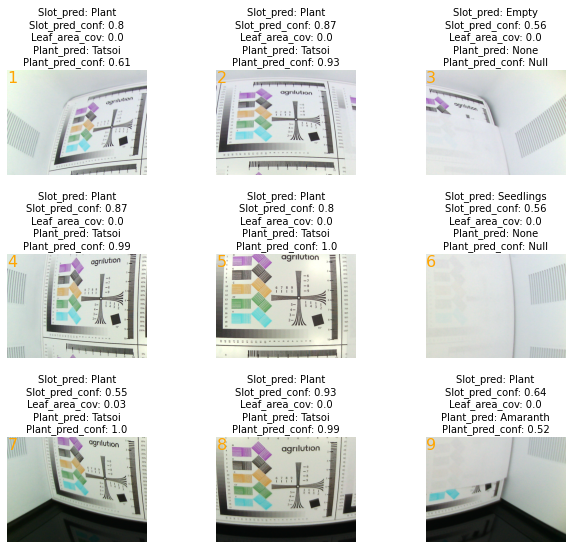

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660126916.jpeg


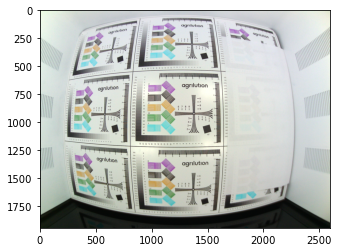

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
176,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660126916,"{""slot_pred"":""Plant"",""slot_pred_conf"":0.795236...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.876076...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.564616...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.872145...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.791545...","{""slot_pred"":""Seedlings"",""slot_pred_conf"":0.56...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.561609...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.927534...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.644906...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


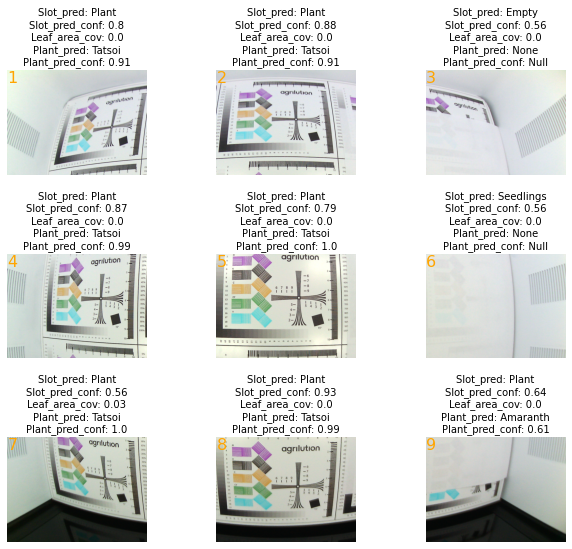

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660127185.jpeg


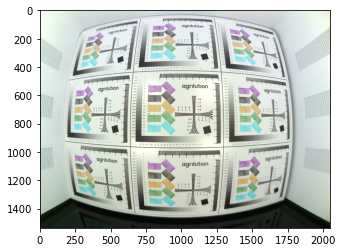

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
178,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660127185,"{""slot_pred"":""Plant"",""slot_pred_conf"":0.781186...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.789186...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.355146...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.843279...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.766117...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.714586...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.523727...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.902409...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.815157...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


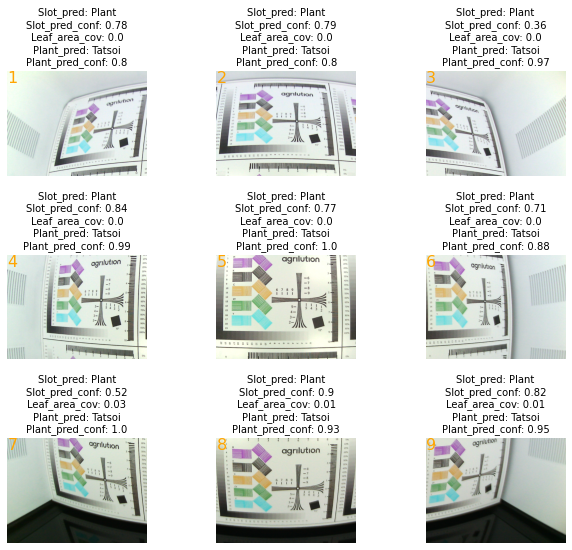

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660127561.jpeg


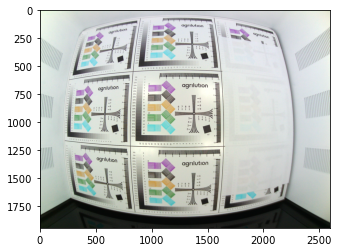

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
183,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660127561,"{""slot_pred"":""Plant"",""slot_pred_conf"":0.799127...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.861676...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.616450...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.825022...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.796587...","{""slot_pred"":""Seedlings"",""slot_pred_conf"":0.53...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.611057...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.934719...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.671421...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


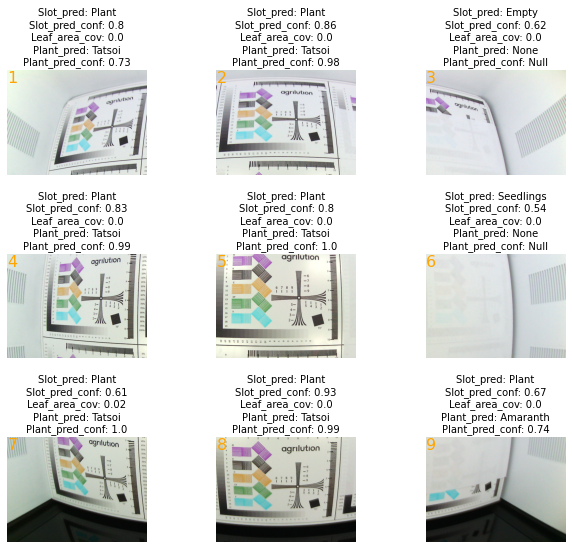

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660140837.jpeg


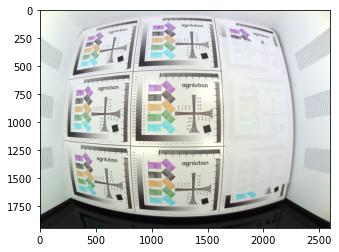

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
188,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660140837,"{""slot_pred"":""Plant"",""slot_pred_conf"":0.771548...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.840123...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.606465...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.807946...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.829415...","{""slot_pred"":""Seedlings"",""slot_pred_conf"":0.55...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.669417...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.938380...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.714180...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


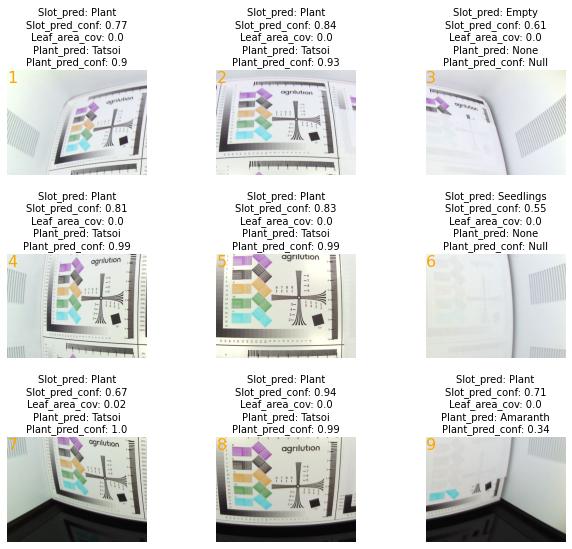

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660144028.jpeg


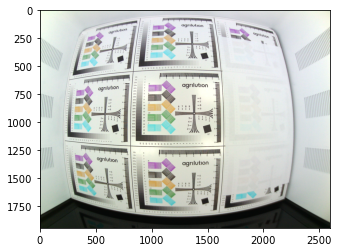

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
191,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660144028,"{""slot_pred"":""Plant"",""slot_pred_conf"":0.806337...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.863197...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.583053...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.801363...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.804167...","{""slot_pred"":""Seedlings"",""slot_pred_conf"":0.56...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.663478...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.924474...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.672103...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


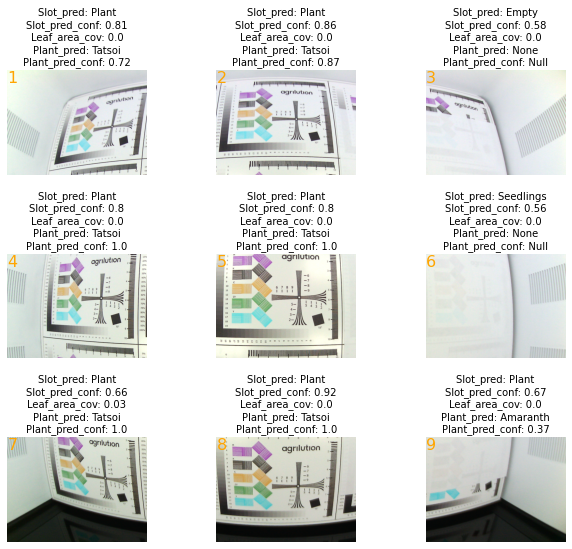

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660144876.jpeg


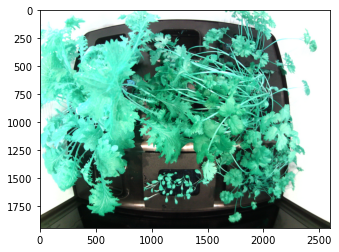

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
196,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660144876,"{""slot_pred"":""Plant"",""slot_pred_conf"":0.960983...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.498527...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.856747...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.930702...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.904138...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.977722...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.774921...","{""slot_pred"":""Seedlings"",""slot_pred_conf"":0.99...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.687007...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


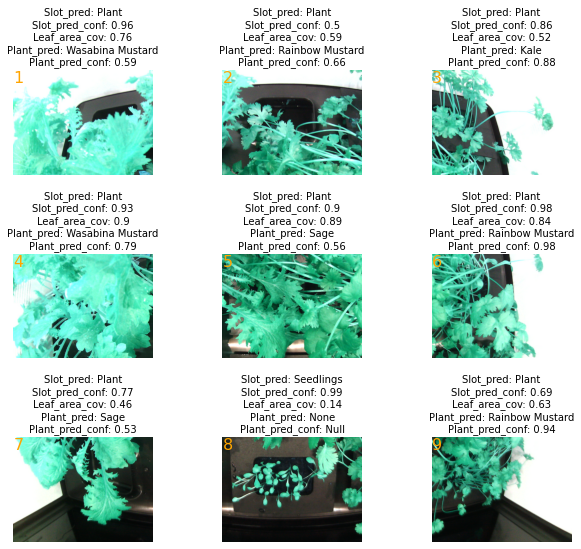

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660145261.jpeg


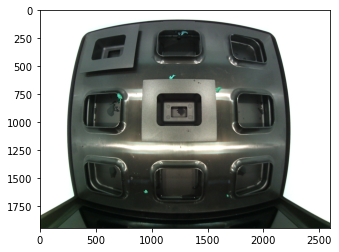

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
199,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660145261,"{""slot_pred"":""Empty"",""slot_pred_conf"":0.820493...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.995098...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.950781...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.999114...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.977963...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.597882...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.734627...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.457710...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.540381...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


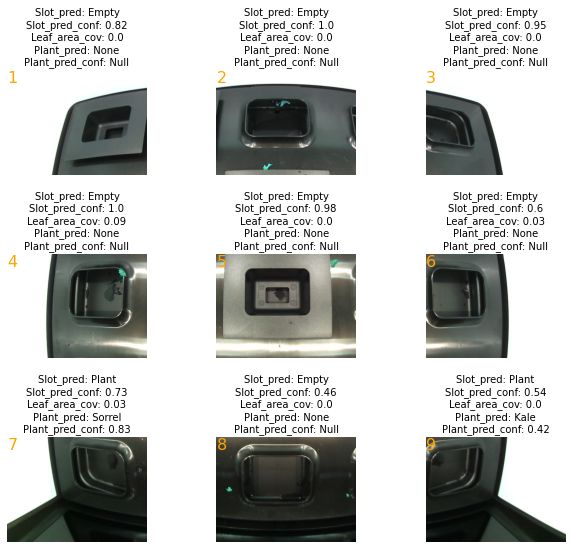

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660633511.jpeg


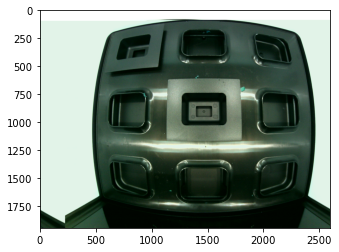

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
202,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660633511,"{""slot_pred"":""Plant"",""slot_pred_conf"":0.645564...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.812629...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.817400...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.657644...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.488392...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.461023...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.629693...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.706628...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.651176...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


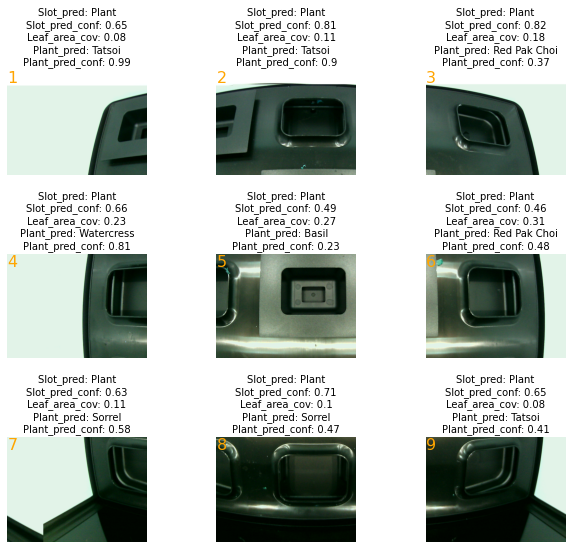

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660653373.jpeg


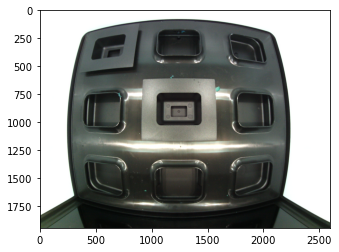

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
205,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660653373,"{""slot_pred"":""Empty"",""slot_pred_conf"":0.889908...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.994287...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.946060...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.998010...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.978804...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.612206...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.673466...","{""slot_pred"":""Seedbar"",""slot_pred_conf"":0.3220...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.605016...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


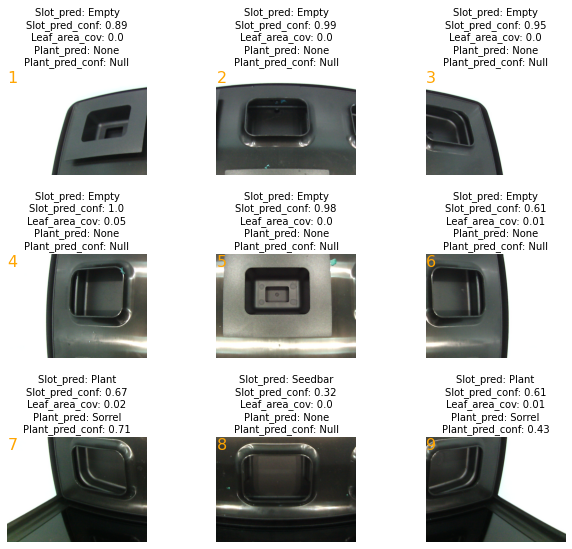

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660653681.jpeg


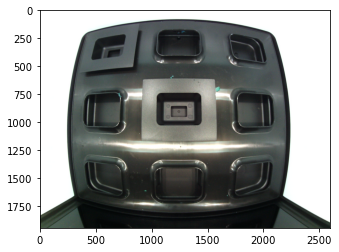

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
206,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660653681,"{""slot_pred"":""Empty"",""slot_pred_conf"":0.920486...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.997221...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.961616...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.998907...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.979238...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.658270...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.730550...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.401158...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.803780...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


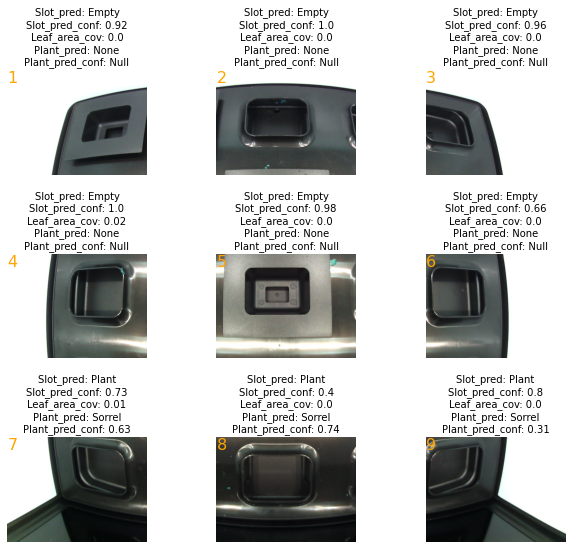

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660654318.jpeg


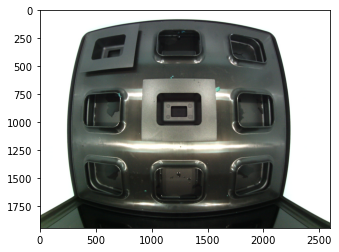

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
208,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660654318,"{""slot_pred"":""Empty"",""slot_pred_conf"":0.881156...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.995813...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.956778...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.999305...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.983753...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.682303...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.649475...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.620610...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.513852...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


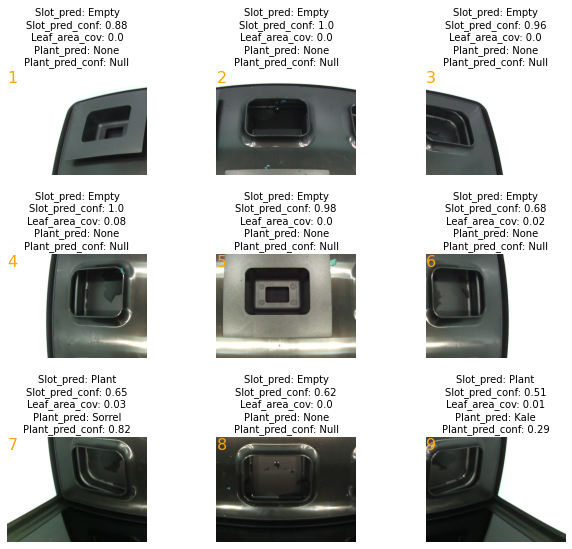

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660654449.jpeg


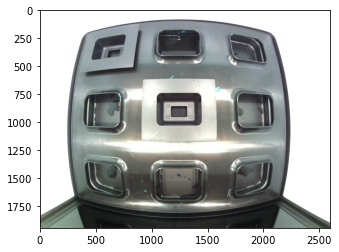

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
210,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660654449,"{""slot_pred"":""Empty"",""slot_pred_conf"":0.919360...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.993505...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.956338...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.994365...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.928416...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.763596...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.604253...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.635154...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.751564...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


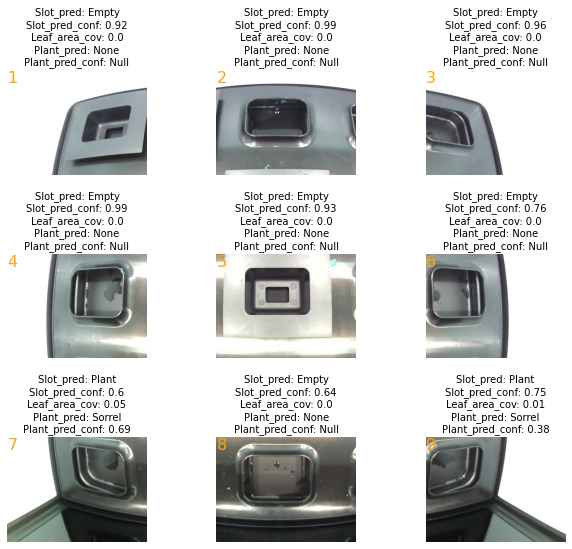

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660654569.jpeg


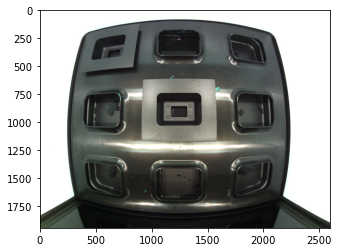

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
212,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660654569,"{""slot_pred"":""Empty"",""slot_pred_conf"":0.903734...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.998754...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.968973...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.999578...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.979855...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.662334...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.651419...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.630677...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.533133...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


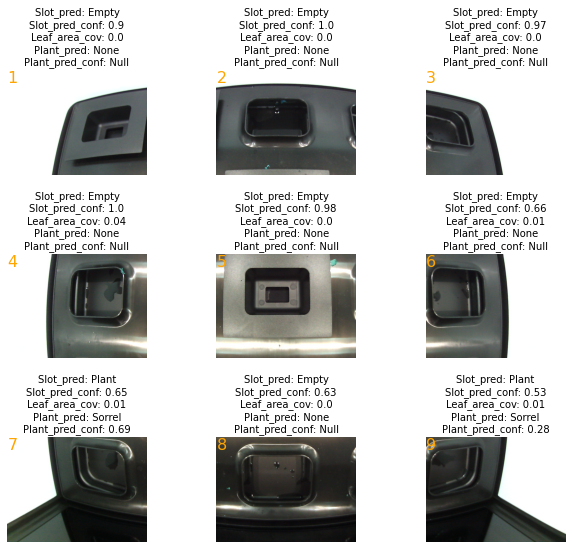

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660719499.jpeg


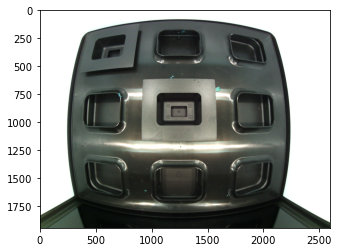

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
213,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660719499,"{""slot_pred"":""Empty"",""slot_pred_conf"":0.879141...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.995764...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.944609...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.998150...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.980168...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.675419...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.680014...","{""slot_pred"":""Seedbar"",""slot_pred_conf"":0.3775...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.596826...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


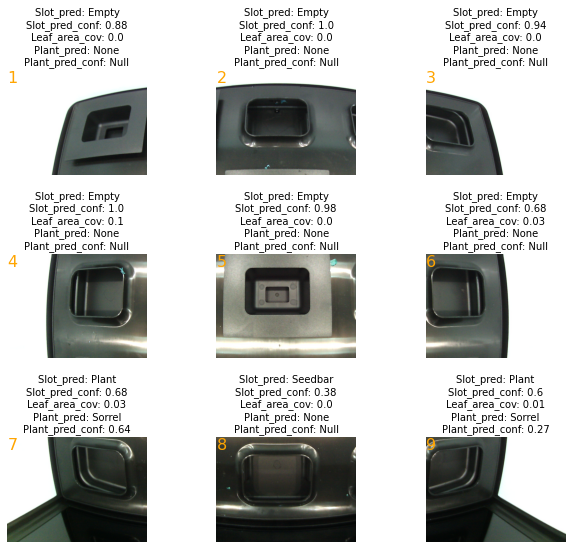

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660719622.jpeg


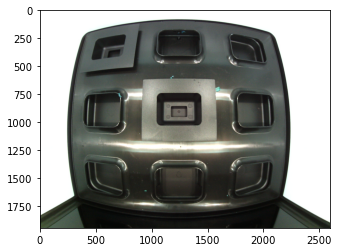

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
215,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660719622,"{""slot_pred"":""Empty"",""slot_pred_conf"":0.845106...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.997749...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.967346...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.998878...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.986669...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.685395...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.554864...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.393219...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.467409...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


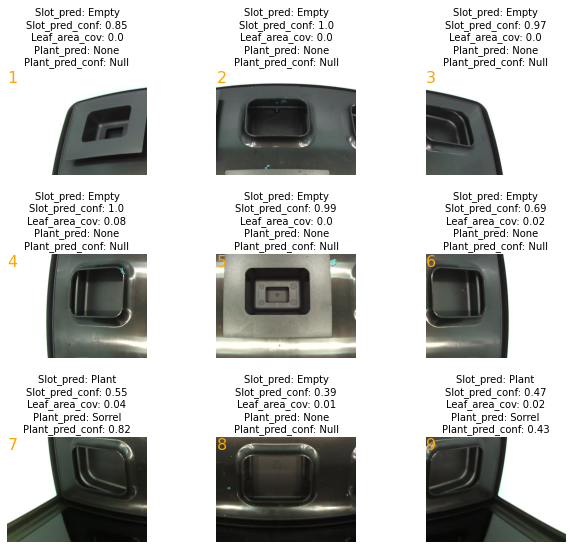

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660720945.jpeg


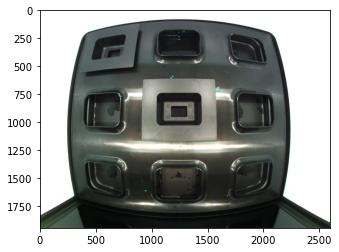

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
221,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660720945,"{""slot_pred"":""Empty"",""slot_pred_conf"":0.905931...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.997571...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.967091...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.999177...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.977039...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.680687...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.686244...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.615447...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.597669...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


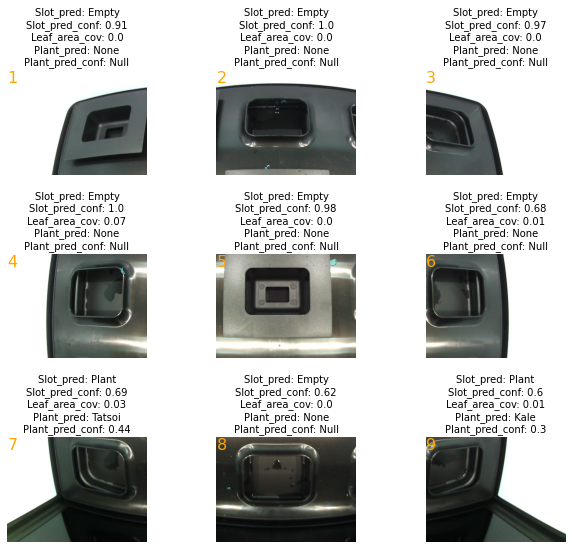

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660721187.jpeg


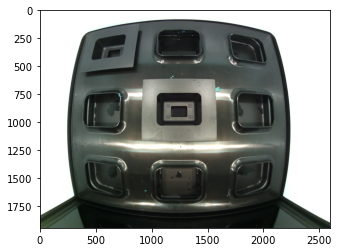

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
224,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660721187,"{""slot_pred"":""Empty"",""slot_pred_conf"":0.900124...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.997831...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.963327...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.999258...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.975277...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.704668...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.666909...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.684589...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.574754...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


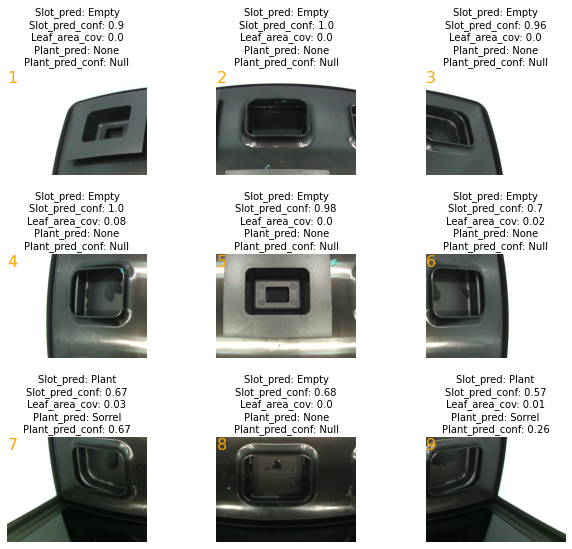

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660721322.jpeg


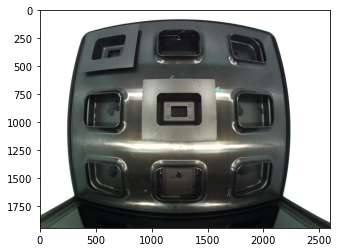

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
226,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660721322,"{""slot_pred"":""Empty"",""slot_pred_conf"":0.916982...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.998137...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.971429...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.999474...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.971004...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.635691...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.760056...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.637853...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.699298...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


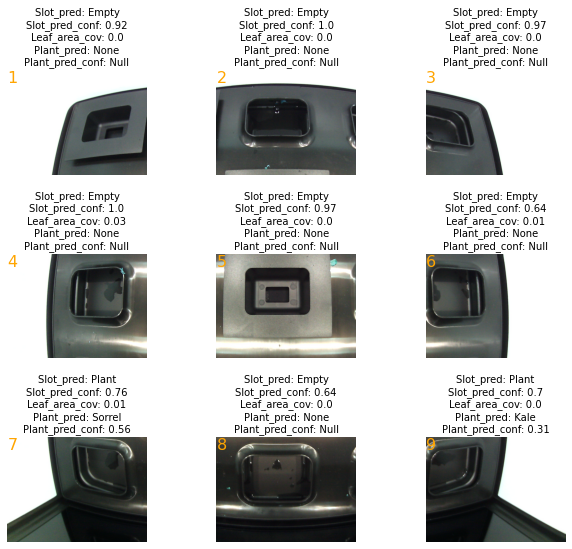

-----------------------------------------------------------------------------------------------
key of s3: v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a/a/1660721442.jpeg


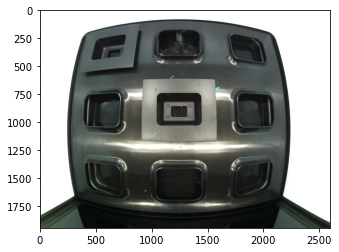

Corresponding data from dynamo db: 


,plantcube,layer,dirty,timestamp,0,1,2,3,4,5,6,7,8,image_url
228,v20-0f0152d4-31b8-4f8d-a735-3d27a61f4a9a,a,False,1660721442,"{""slot_pred"":""Empty"",""slot_pred_conf"":0.889319...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.989259...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.963120...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.999230...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.964228...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.790067...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.652228...","{""slot_pred"":""Empty"",""slot_pred_conf"":0.711555...","{""slot_pred"":""Plant"",""slot_pred_conf"":0.537058...",https://app-plantcube-images-dev.s3.eu-central...


Displaying Image as individual slots: 


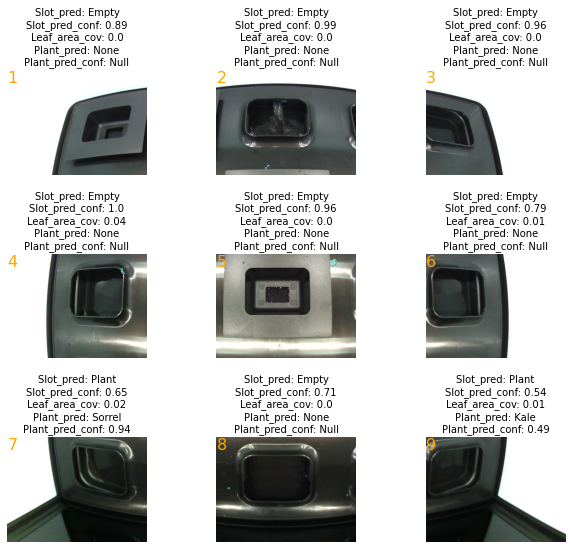

-----------------------------------------------------------------------------------------------


In [34]:
# main code
import json

##s3
# Create an S3 client
s3 = boto3.client('s3')

# Set the name of the bucket and the prefix of the objects you want to retrieve
bucket_name = 'plantcube-images-dev'

# List the objects in the bucket
objects = s3.list_objects(Bucket=bucket_name)

# Set the counter variable to 0
counter = 0
max_iterations = 30

# Iterate through the objects in s3 bucket and retrieve each one
for obj in objects['Contents']:
    # Get the object key (the full path to the object in the bucket)
    s3_key = obj['Key']
    #print('key of s3: ',s3_key)
    print(color.RED + 'key of s3: '+  color.END + s3_key)

    s3_client = boto3.client('s3')
    # Use the S3 client to get the image from s3 bucket
    input_image = get_input_image(s3_client, bucket_name, s3_key)
    
    # If the image is not avaialble
    if input_image is None:
        print('No Image is available')
    # otherwise display the image
    else:
        plt.imshow(input_image)
        plt.show()
    
    #get the corresponding data from dynamodb for the particular image
    values = s3_key.split('/')
    plantcube = values[0]
    layer = values[1]
    time = values[2][:values[2].index('.')]
    time = int(time)
    
    #get the matching record from dynamodb
    data_from_dynamo = df.loc[(df['plantcube'] == plantcube) & (df['layer'] == layer) & (df['timestamp'] == time)]
    data_from_dynamo = pd.DataFrame(data_from_dynamo)
    
    print(color.RED + 'Corresponding data from dynamo db: '+  color.END)
    display(data_from_dynamo)

    
    data_from_dynamo1 = data_from_dynamo.copy()
    data_from_dynamo1.rename(columns = {'0':'col0', '1':'col1','2':'col2','3':'col3','4':'col4','5':'col5','6':'col6','7':'col7','8':'col8'}, inplace = True)
    if data_from_dynamo1['image_url'].isnull().any():
        print('No values in the slot')
    else:
        parsed_data = data_from_dynamo1[['col0', 'col1', 'col2', 'col3', 'col4', 'col5', 'col6', 'col7', 'col8']].applymap(json.loads)
        normalized_df = pd.json_normalize(parsed_data.to_dict(orient='records'))  
    
    # if the image url is empty
    if data_from_dynamo['image_url'].isnull().any():
        print('')
    # otherwise, display the image in grid with titles.
    else:
        print(color.RED + 'Displaying Image as individual slots: '+  color.END)
        display_image_as_grid(input_image,normalized_df)
    
    print(color.DARKCYAN +'-----------------------------------------------------------------------------------------------'+  color.END)
    
    # Increment the counter
    counter += 1

    # If the counter is equal to the maximum number of iterations, break out of the loop
    if counter == max_iterations:
        break